In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

dark_horse = cv2.imread("/Users/baranidharan/Desktop/DATA/horse.jpg") # ORIGINAL BGR format FOR OPENCV (to perform calculation)
show_horse = cv2.cvtColor(dark_horse,cv2.COLOR_BGR2RGB) # CONVERTED TO RGB for SHOWING

rainbow = cv2.imread("/Users/baranidharan/Desktop/DATA/rainbow.jpg")
show_rainbow = cv2.cvtColor(rainbow,cv2.COLOR_BGR2RGB)

blue_bricks = cv2.imread("/Users/baranidharan/Desktop/DATA/bricks.jpg")
show_bricks = cv2.cvtColor(blue_bricks,cv2.COLOR_BGR2RGB)



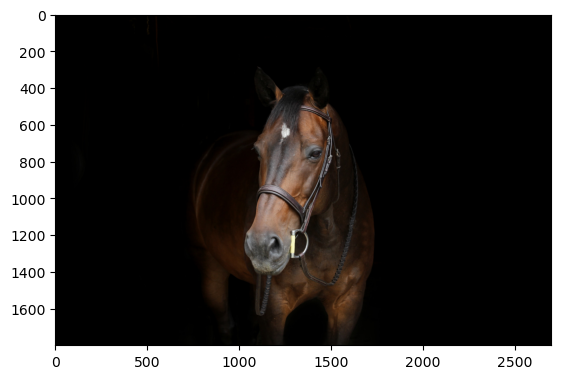

In [3]:
plt.imshow(show_horse)

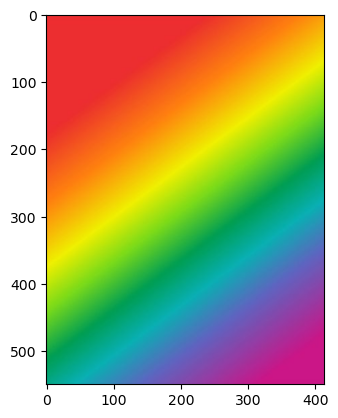

In [4]:
plt.imshow(show_rainbow)

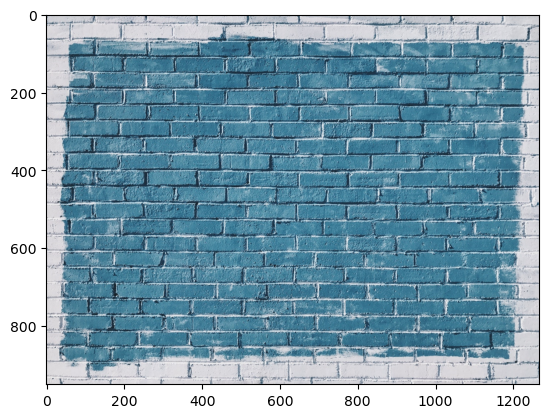

In [5]:
plt.imshow(show_bricks)

# Calculate the Histogram Values

In [11]:
# OPENCV BGR 
hist_bricks = cv2.calcHist(images = [blue_bricks],channels = [0],mask = None, histSize = [256], ranges = [0,256])

In [12]:
hist_bricks.shape

(256, 1)

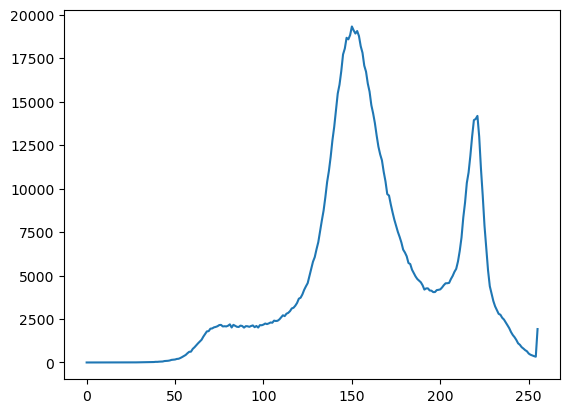

In [13]:
plt.plot(hist_bricks)

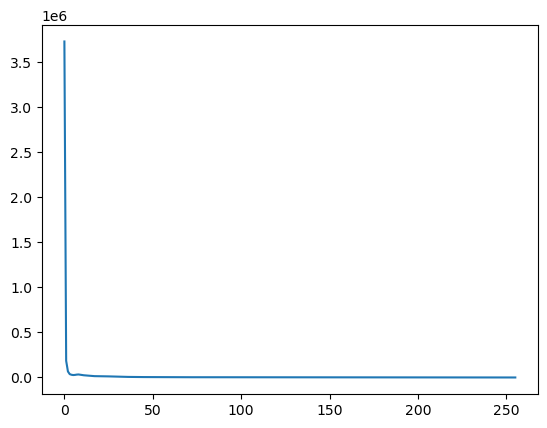

In [14]:
hist_dark_horse = cv2.calcHist(images = [dark_horse],channels = [0],mask = None, histSize = [256], ranges = [0,256])
plt.plot(hist_dark_horse)

# Most of the image is black so the graph dropped to zero

# 3 Color Histogram all at once in Bluebricks image 

Text(0.5, 1.0, 'Histogram of Blue Bricks')

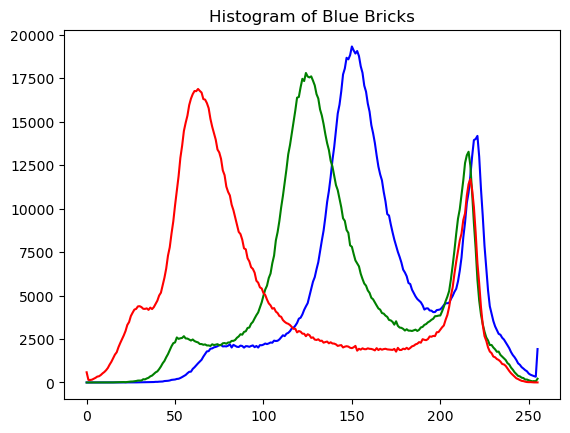

In [21]:
img = blue_bricks
#assigning the color channel as a string for recognizing by OpenCv
color = ('b','g','r')

for i,col in enumerate(color):
    # So, in this calcHist we are going to pass this color (created above) as a channel inside the function
    histr = cv2.calcHist(images = [img],channels = [i],mask = None, histSize = [256], ranges = [0,256])
    plt.plot(histr,color=col)
#     plt.xlim([0,256])
plt.title("Histogram of Blue Bricks")


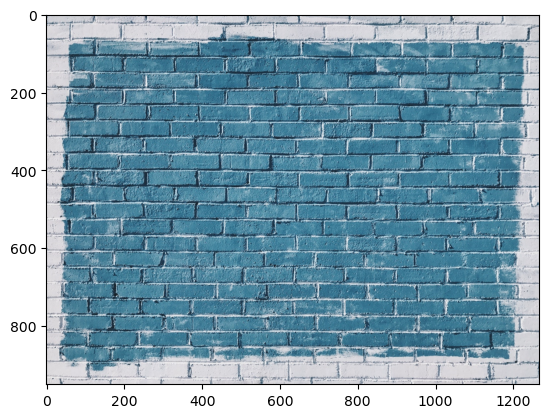

In [24]:
plt.imshow(show_bricks)

# So, we can see the high level of contribution from Blue as per the image in the histogram.

# 3 Color Histogram all at once in Horse image 

Text(0.5, 1.0, 'Histogram of Dark Horse')

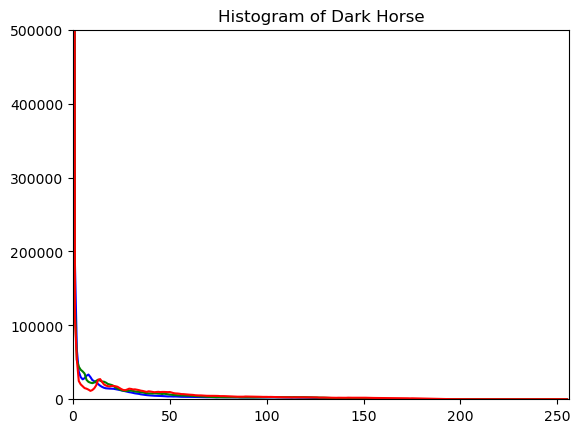

In [30]:
img = dark_horse
#assigning the color channel as a string for recognizing by OpenCv
color = ('b','g','r')

for i,col in enumerate(color):
    # So, in this calcHist we are going to pass this color (created above) as a channel inside the function
    histr = cv2.calcHist(images = [img],channels = [i],mask = None, histSize = [256], ranges = [0,256])
    plt.plot(histr,color=col)
    plt.xlim([0,256])
    # Reducing the y limit as well
    plt.ylim([0,500000])
    
plt.title("Histogram of Dark Horse")



In [31]:
dark_horse.shape

(1800, 2700, 3)

# 3 Color Histogram all at once in Rainbow image 

Text(0.5, 1.0, 'Histogram of Rainbow')

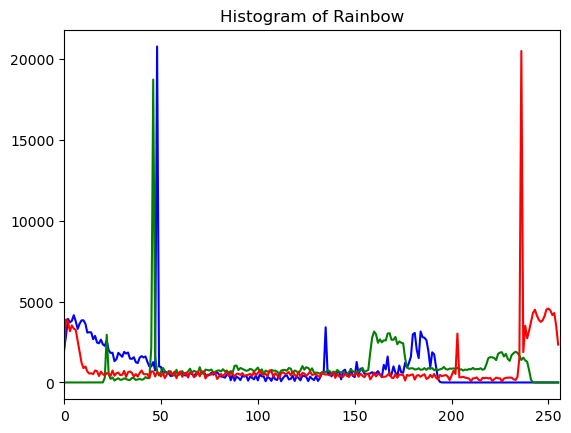

In [28]:
img = rainbow
#assigning the color channel as a string for recognizing by OpenCv
color = ('b','g','r')

for i,col in enumerate(color):
    # So, in this calcHist we are going to pass this color (created above) as a channel inside the function
    histr = cv2.calcHist(images = [img],channels = [i],mask = None, histSize = [256], ranges = [0,256])
    plt.plot(histr,color=col)
    plt.xlim([0,256])
plt.title("Histogram of Rainbow")

 # Histogram Equalization
 #We can select an ROI and only calculate the color histogram of that masked section.
 Histogram equlization is a method of contrast adjustment based on the image's histogram.

In [32]:
rainbow = cv2.imread("/Users/baranidharan/Desktop/DATA/rainbow.jpg")
show_rainbow = cv2.cvtColor(rainbow,cv2.COLOR_BGR2RGB)

img = rainbow
img.shape

(550, 413, 3)

In [35]:
img.shape[:2]

(550, 413)

#Creating a mask for the rainbow image to apply the hist equ on it.

In [34]:
mask = np.zeros(img.shape[:2],dtype = np.uint8)

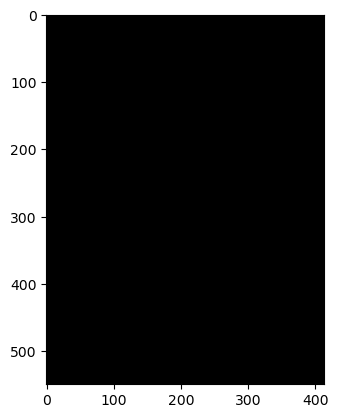

In [37]:
plt.imshow(mask,cmap="gray")

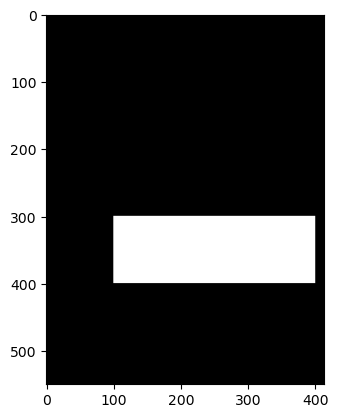

In [39]:
# Now, We are going to a rectangle area in the mask as ROI 

mask[300:400,100:400] = 255
plt.imshow(mask,cmap="gray")

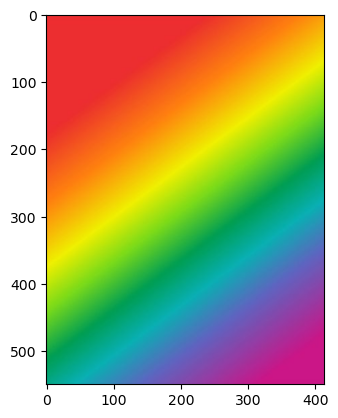

In [41]:
plt.imshow(show_rainbow)

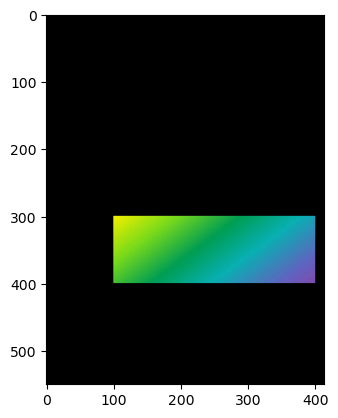

In [40]:
# Applying bitwise_and 

# This masked_img calculates the actual histogram calculation
masked_img = cv2.bitwise_and(src1=img,src2=img,mask=mask)

# show_masked_img is particularly for visulization purpose
show_masked_img = cv2.bitwise_and(src1=show_rainbow,src2=show_rainbow,mask=mask)

plt.imshow(show_masked_img)



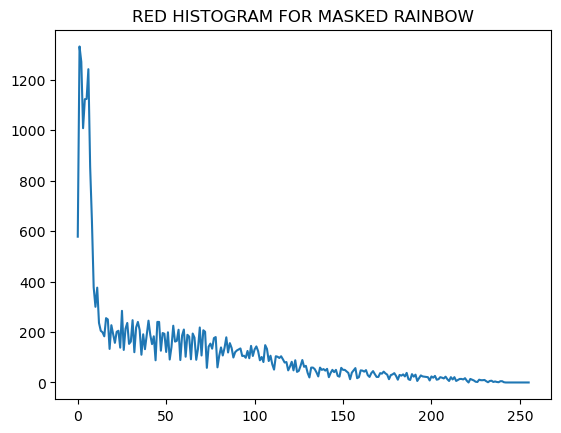

In [46]:
# Calculation of Histogram values

# in OpenCv B[0] G[1] R[2], so we are going to calculate the histogram for the red channel [2]

hist_mask_value_red = cv2.calcHist(images = [rainbow],channels = [2],mask = mask, histSize = [256], ranges = [0,256])
plt.title ("RED HISTOGRAM FOR MASKED RAINBOW")

plt.plot(hist_mask_value_red)

# In this output, we can see that there is very low values of red

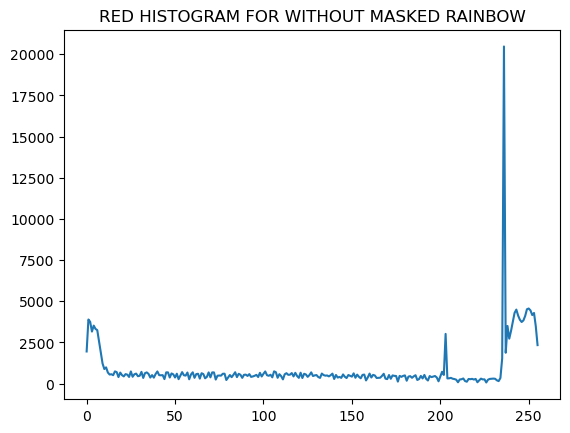

In [47]:
# We are going to calculate the histogram for the red channel [2] # WITHOUT MASK

#Full Rainbow image 
hist_value_red = cv2.calcHist(images = [rainbow],channels = [2],mask = None, histSize = [256], ranges = [0,256])
plt.title ("RED HISTOGRAM FOR WITHOUT MASKED RAINBOW")

plt.plot(hist_value_red)

# In this output, we can see the most of the image is represented through the red channel

# Main execuation of  Histogram Equalization

In [48]:
gorilla = cv2.imread("/Users/baranidharan/Desktop/DATA/gorilla.jpg")

def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

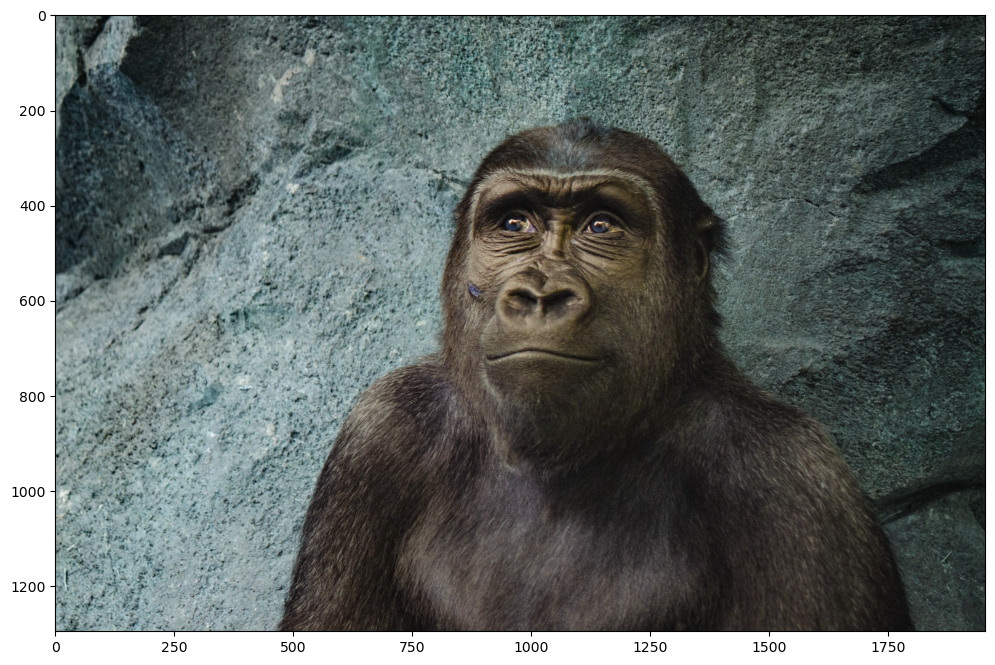

In [49]:
display_img(gorilla)

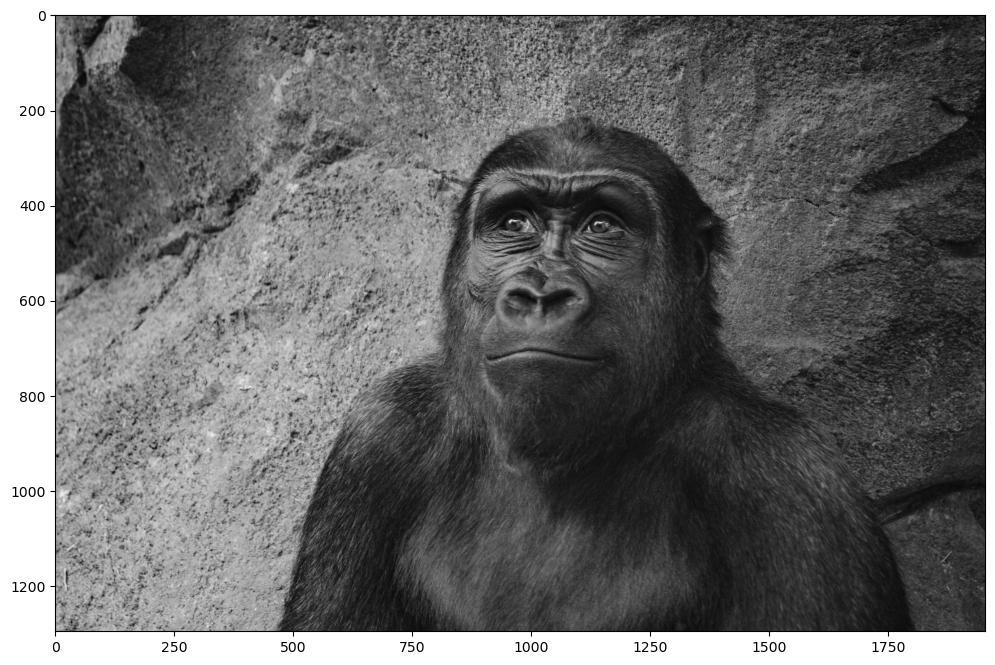

In [51]:
gorilla = cv2.imread("/Users/baranidharan/Desktop/DATA/gorilla.jpg",0)

def display_img(img,cmap=None):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap='gray')
display_img(gorilla,cmap="gray")

In [52]:
gorilla.shape

(1295, 1955)

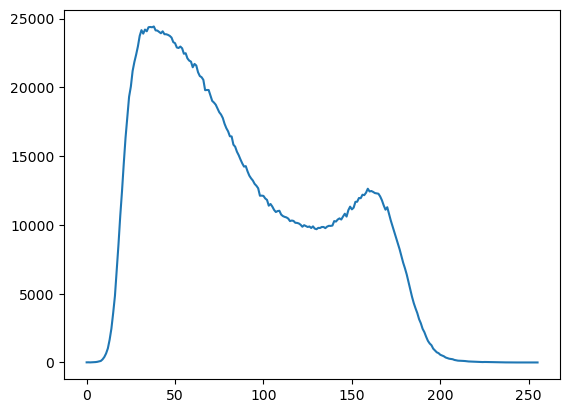

In [53]:
hist_value_gorilla = cv2.calcHist(images = [gorilla],channels = [0], mask = None, histSize = [256], ranges = [0,256] )
plt.plot(hist_value_gorilla)

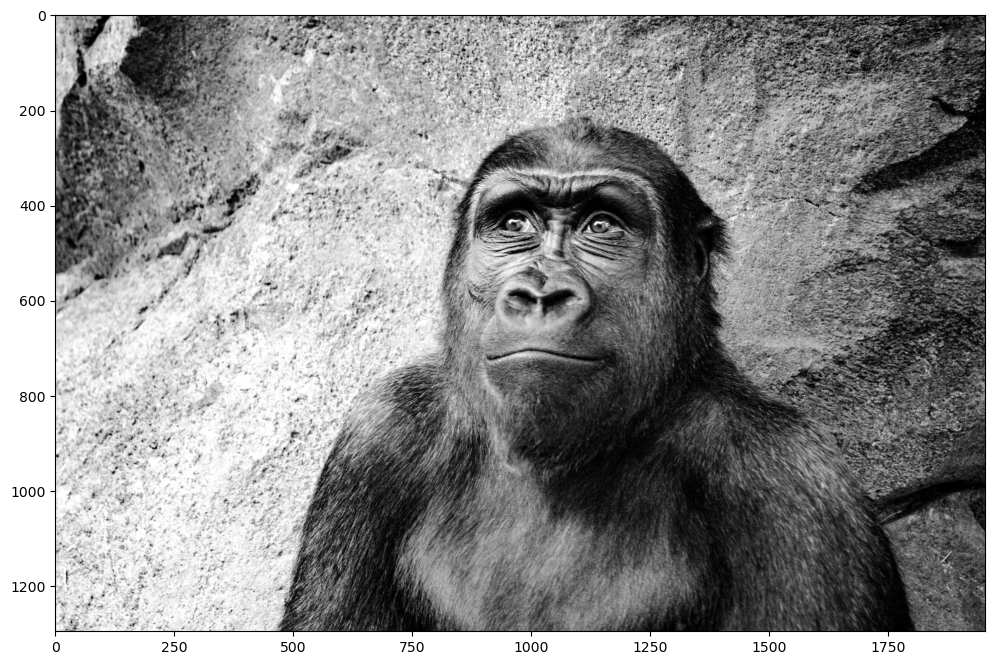

In [54]:
# Equalizing image 

equ_gorilla = cv2.equalizeHist(src=gorilla)
display_img(equ_gorilla,cmap="gray")


#This equlizer will increase the contrast

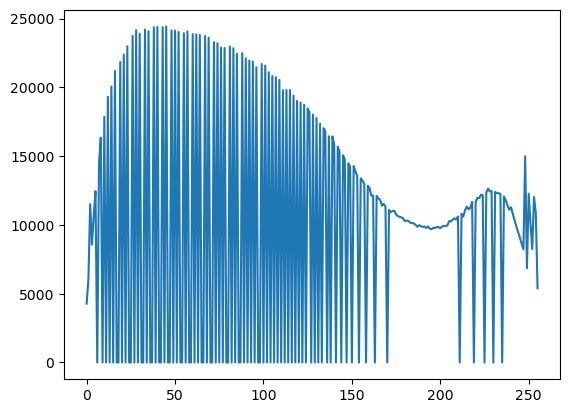

In [55]:
hist_value_gorilla = cv2.calcHist(images = [equ_gorilla],channels = [0], mask = None, histSize = [256], ranges = [0,256] )
plt.plot(hist_value_gorilla)

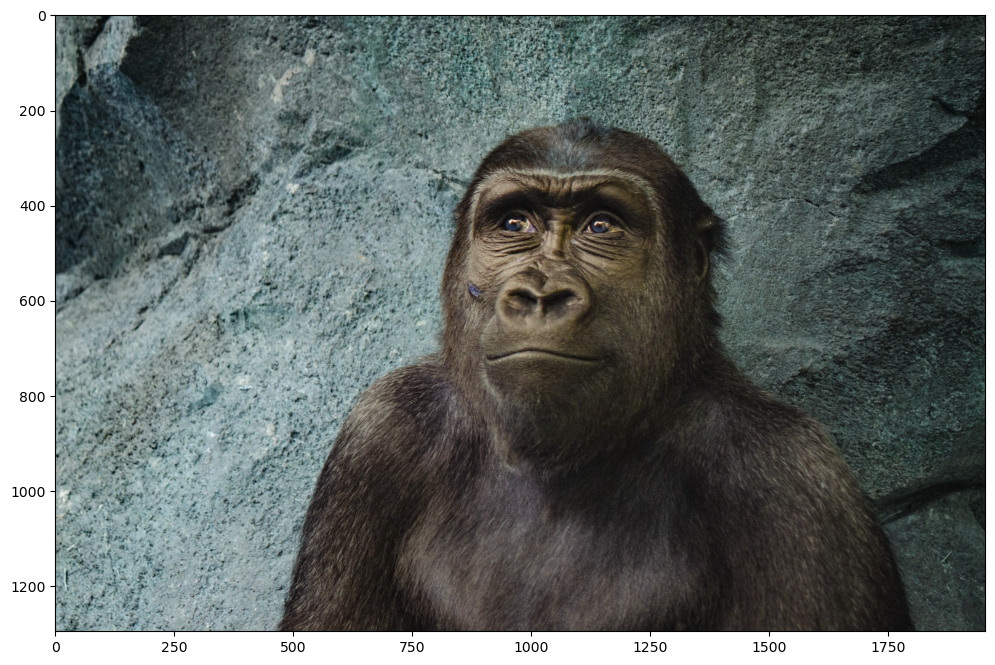

In [57]:
color_gorilla = cv2.imread("/Users/baranidharan/Desktop/DATA/gorilla.jpg")
display_img(color_gorilla)

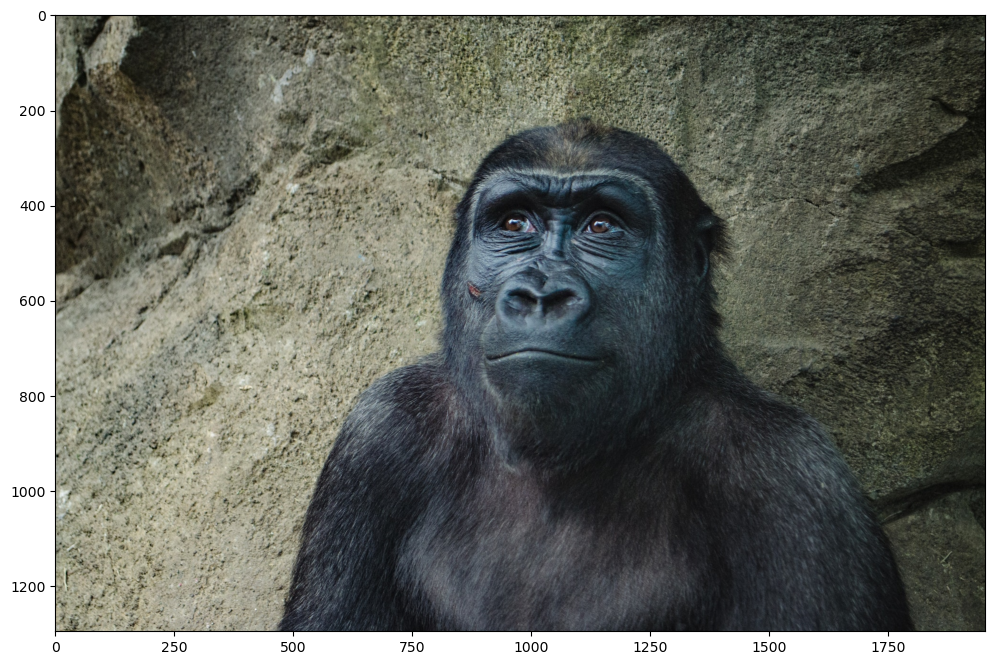

In [58]:
show_gorilla =  cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2RGB)
display_img(show_gorilla)

In [59]:
# We need to conver the image to HSV - High Saturation Value for OpenCV
hsv = cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2HSV)

# h[0] s[1] v[2] - channel

hsv[:,:,2]

#Value Channel

array([[127, 121, 115, ...,  43,  42,  42],
       [121, 124, 123, ...,  47,  49,  51],
       [118, 129, 131, ...,  47,  50,  53],
       ...,
       [196, 198, 185, ...,  55,  55,  55],
       [184, 185, 182, ...,  51,  52,  53],
       [174, 170, 173, ...,  49,  50,  50]], dtype=uint8)

In [60]:
hsv[:,:,2].min()

1

In [61]:
# we are going to equlze the channel and replace the values 

hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])


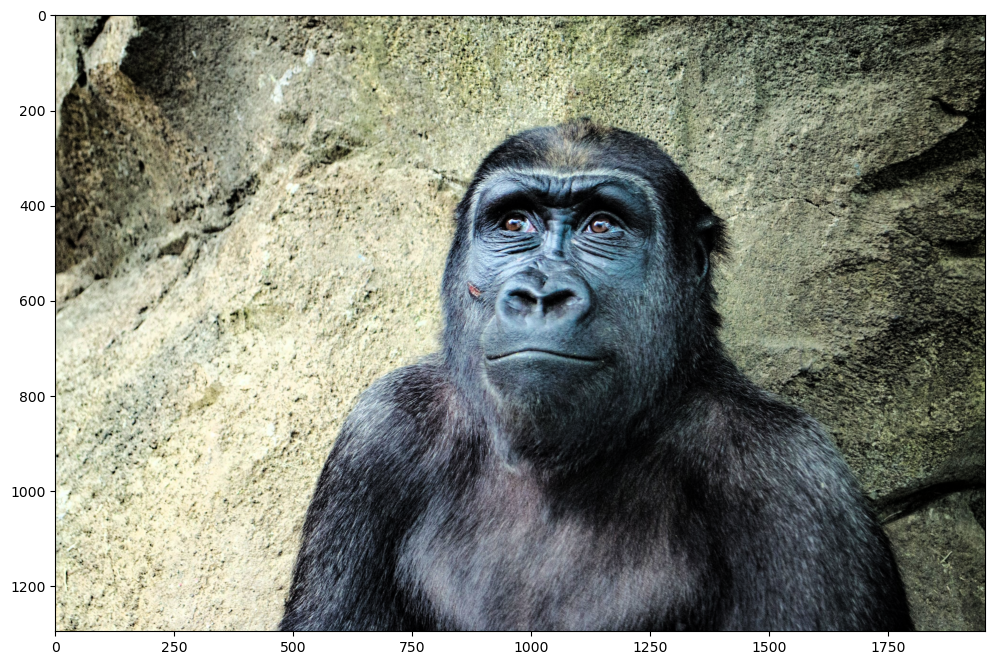

In [62]:
eq_color_gorilla = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
display_img(eq_color_gorilla)